In [1]:
import matplotlib.pyplot as plt
import numpy as np 
import tensorflow as tf
import gc
import zlib
import cv2
import pickle
import time

In [15]:
def generate_velocity_model():
    
    input_shape =  (28, 16, 1)
    
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Lambda(lambda x: x/255,input_shape=input_shape))
    model.add(tf.keras.layers.Conv2D(filters=16, kernel_size=3, padding="same", activation="relu", input_shape=input_shape))
    model.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2, padding='valid'))
    model.add(tf.keras.layers.Conv2D(filters=16, kernel_size=3, padding="same", activation="relu"))
    model.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2, padding='valid'))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(units=32, activation='relu'))
    model.add(tf.keras.layers.Dense(units=10, activation='softmax'))
    
    model.load_weights('../model_velocity_outrun.h5')
    
    return model

def return_velocity_score(image,model):
        
    limit_numbers_1 = np.arange(33,9,-8)
    limit_numbers_2 = np.arange(41,17,-8)
    
    img = process_img( cv2.resize(image, (640,440), interpolation = cv2.INTER_AREA))
    
    velocity = 0
    
    for j in range(len(limit_numbers_1)):
        
        i = model.predict(np.expand_dims(np.expand_dims(img[25*2:39*2,limit_numbers_1[j]*2:limit_numbers_2[j]*2],axis=-1),axis=0))[0]
        
        velocity = velocity + i.argmax()*(10**(j))
    
    return velocity

#generate score model
def generate_scoring_model():
    
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Lambda(lambda x: x/255,input_shape=(9, 8, 1)))
    model.add(tf.keras.layers.Conv2D(filters=16, kernel_size=3, padding="same", activation="relu"))
    model.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2, padding='valid'))
    model.add(tf.keras.layers.Conv2D(filters=16, kernel_size=3, padding="same", activation="relu"))
    model.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2, padding='valid'))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(units=32, activation='relu'))
    model.add(tf.keras.layers.Dense(units=10, activation='softmax'))
    
    model.load_weights('../model_score_outrun.h5')
    
    return model

def return_score(image,model):
    limit_numbers_1 = np.arange(200,136,-8)
    limit_numbers_2 = np.arange(192,128,-8)
    
    score = 0
    
    for j in range(len(limit_numbers_1)):
        
        i = model.predict(np.expand_dims(np.expand_dims(image[15:24,limit_numbers_2[j]:limit_numbers_1[j]],axis=-1),axis=0))[0]
        
        score = score + i.argmax()*(10**j)
    
    return score


def generate_position_model():
    input_shape =  (80, 200, 1)
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Lambda(lambda x: x/255,input_shape=input_shape))
    model.add(tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", activation="relu", input_shape=input_shape))
    model.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2, padding='valid'))
    model.add(tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding="same", activation="relu"))
    model.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2, padding='valid'))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(units=64, activation='relu'))
    model.add(tf.keras.layers.Dense(units=1, activation='linear'))
    
    model.load_weights('../model_position_score_outrun.h5')
    
    return model

def return_position_score(image,model):
        
    score = model.predict(np.expand_dims(np.expand_dims(process_img(image[140:,50:250]),axis=-1),axis=0))[0]
    
    return score

#
# REINFORCEMENT LEARNING MODEL
#

def capture_return_decision(model,images):
    
    # predict command
    imgs = np.array(images).astype(np.uint8)
    imgs = np.expand_dims(imgs, axis=0)
    imgs = np.swapaxes(imgs,1,2)
    imgs = np.swapaxes(imgs,2,3)
    
    """
    try:
        print(hashlib.md5(imgs.tobytes()).hexdigest())
    except Exception as inst:
        print('erro hash')
        print(inst)
    """
    
    return model.predict(imgs.astype(np.float32))

def model_capture_return_images(images): 
    
    # predict command
    imgs = np.array(images).astype(np.uint8)
    #imgs = np.expand_dims(imgs, axis=0)
    imgs = np.swapaxes(imgs,0,1)
    imgs = np.swapaxes(imgs,1,2)
    #print('model_capture_return_images shape',imgs.shape)
    return imgs.astype(np.float32)

# action model
def generate_model():

    json_file = open("../modelo_outrun_ae.json", 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    model = tf.keras.models.model_from_json(loaded_model_json)
    model.load_weights("../modelo_outrun_ae.hdf5")
    print("Loaded model from disk")
    
    return model


def process_img(image, sigma=0.4):
	# compute the median of the single channel pixel intensities
    v = np.median(image)
    # apply automatic Canny edge detection using the computed median
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    edged = cv2.Canny(image, lower, upper)
    # return the edged image
    return edged

In [3]:
def save_to_file(objeto, nome_arquivo):
    with open(nome_arquivo, 'wb') as output:
        pickle.dump(objeto, output, pickle.HIGHEST_PROTOCOL)


def load_file(nome_arquivo):
    with open(nome_arquivo, 'rb') as input:
        objeto = pickle.load(input)
    return objeto

In [4]:
queue = load_file('fila_treino_997.0_1.pkl')

In [75]:


#epoch yet to be implemented.
gpus = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpus[0], True)

score_model = generate_scoring_model()
position_score_model = generate_position_model()
velocity_model = generate_velocity_model()

#Applying Q-Learning
# learning rate - in reinforcement learning, this is gamma
"""
LR = 0.5 * (1 - ((epoch-1)/10000))

if LR < 0.1:
    LR = 0.1
"""

LR = 0.01

actionList = []
act_rightleft = []
frame_imgs = []
score = []
score_accbrake = []
score_position = []
velocity = []
velocityModel = []
time = []

print('Starting to organize data before training... Nº', 0, 'of', len(queue),'samples.                ', end='\r')
for i in np.arange(5,len(queue)-5,1):
    print('Starting to organize data before training... Nº', i, 'of', len(queue),'samples.             ', end='\r')
    frame_imgs.append(model_capture_return_images( [ process_img(j[0][120:,60:270]) for j in queue[i-4:i+1]]))
    # model actions
    actionList.append(queue[i][1][0])
    # appending score
    score_i = return_score(queue[i][0],score_model)
    score_f = return_score(queue[i+5][0],score_model)
    
    score_points = np.clip( ( score_f - score_i)/(5*700) ,0,1)
    
    score_pos = return_position_score(queue[i+1][0],position_score_model)[0]
    
    vel = np.clip( return_velocity_score(queue[i][0],velocity_model)/170, 0,1)
    
    velocity.append(vel)
    
    velocityModel.append(np.clip( return_velocity_score(queue[i+5][0],velocity_model)/170, 0,1) - vel)
    
    
    if vel == 0 and score_points == 0:
        
        score_accbrake.append(0)

        score_position.append(0)
        
        score.append( np.log(1) )
    
    else:

        score_accbrake.append( score_points )

        #score_position.append( np.clip( score_pos[0] + np.clip((score_points/1000) if score_points > 100 else -0.5, -0.5, 0.1) , -0.5, 1) )
        score_position.append( score_pos) 
        
        score.append( np.log( np.clip(velocityModel[-1] + score_pos*2 + score_points, 0.0001, 100) ) )

    #time between samples
    time.append(queue[i+5][2]-queue[i][2])

    # Q - Learning Happening Here

    action = actionList[-1].copy()

    for i,j in enumerate(action):

        if i == action.argmax():

            action[i] = np.clip(action[i] + LR*score_accbrake[-1],0,1)

        else:

            action[i] = np.clip(action[i],0,1)

    actionList[-1] = action.copy()

    ###                           ###

    # Just some causality for idiotic future
    if vel == 0 and score_points == 0:

        for p in range(i,i-15,-1):
            try:

                actionList[p][actionList[p].argmax()] = np.clip(actionList[p][actionList[p].argmax()] - 0.1, 0, 1)

                score[p] = np.log( np.clip(velocityModel[p] + score_position[p]*2 + score_accbrake[p] - 0.1, 0.0001, 100) ) 

            except:
                pass

# pre trained model
# create train 
dict_train = {}
dict_train['output'] = np.array(actionList)

frame_imgs = np.array(frame_imgs)

# the only way it works
model = generate_model()
model.load_weights("D:/TensorflowAPI/modelo_outrun_ae.hdf5")
model.compile(loss=tf.keras.losses.MeanSquaredError(),
          optimizer=tf.keras.optimizers.SGD(),
          metrics=['mse','mae'])

model.fit(frame_imgs, dict_train,
          batch_size=20,
          epochs=1,
          shuffle = True,
          validation_data=(frame_imgs, dict_train)
         )

print('AccBrake',np.round(dict_train['output'][-20:]*100),2)

Loaded model from diskata before training... Nº 481 of 487 samples.               166 of 487 samples.              samples.             
Train on 477 samples, validate on 477 samples
477/477 [==============================] - 5s 10ms/sample - loss: 0.8866 - mse: 0.0819 - mae: 0.2183 - val_loss: 0.8311 - val_mse: 0.0269 - val_mae: 0.1274
AccBrake [[ 0.  9.  9.  0.  1.  0. 58. 11. 32.]
 [ 0.  8.  9.  0.  0.  0. 61. 12. 34.]
 [ 0.  7.  8.  0.  0.  0. 64. 12. 32.]
 [ 0.  9. 11.  0.  0.  0. 61. 13. 35.]
 [ 0.  7.  7.  0.  0.  0. 63. 12. 36.]
 [ 0.  9.  6.  0.  0.  0. 63. 13. 33.]
 [ 0.  5.  6.  0.  0.  0. 62. 16. 30.]
 [ 0.  8.  7.  0.  1.  0. 63. 16. 32.]
 [ 0.  7.  5.  0.  0.  0. 64. 16. 30.]
 [ 1.  5.  6.  0.  0.  0. 63. 16. 31.]
 [ 1.  5.  6.  0.  0.  0. 63. 16. 31.]
 [ 1.  5.  6.  0.  0.  0. 63. 16. 31.]
 [ 1.  5.  6.  0.  0.  0. 64. 16. 31.]
 [ 1.  5.  6.  0.  0.  0. 64. 16. 31.]
 [ 1.  5.  6.  0.  0.  0. 64. 16. 31.]
 [ 1.  5.  6.  0.  0.  0. 64. 16. 31.]
 [ 1.  5.  6.  0.  0.  0. 64

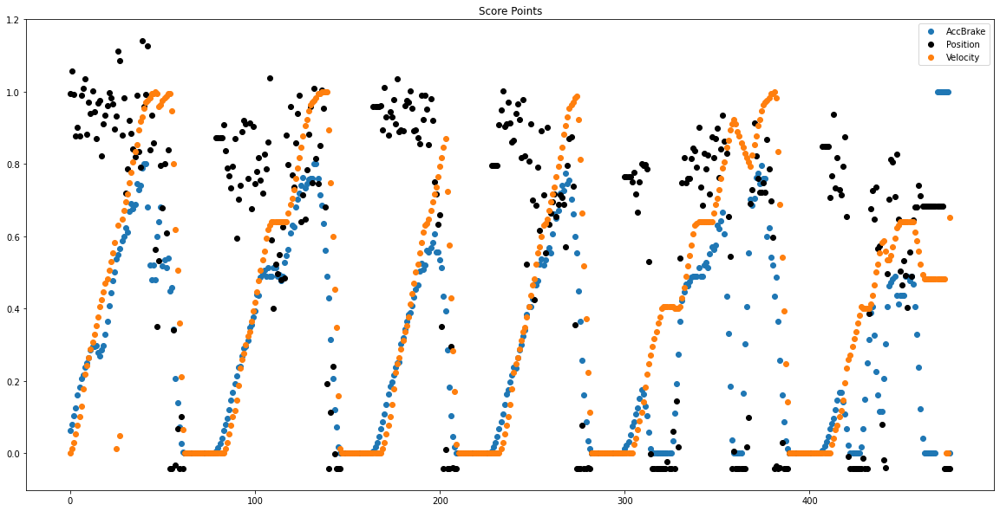

In [76]:
plt.figure(figsize=(20,10))
plt.title('Score Points')
plt.plot(score_accbrake[:],'o',label='AccBrake')
plt.plot(score_position[:],'ko', label='Position')
plt.plot(velocity[:],'o', label='Velocity')
plt.legend()

No handles with labels found to put in legend.


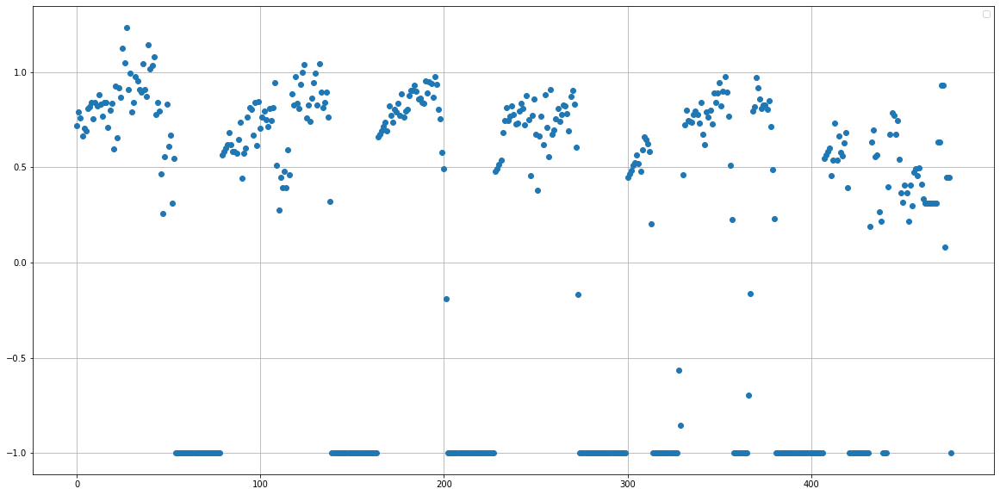

In [77]:
plt.figure(figsize=(20,10))
plt.plot(np.clip(score, -1, 100), 'o')
plt.grid()
plt.legend()

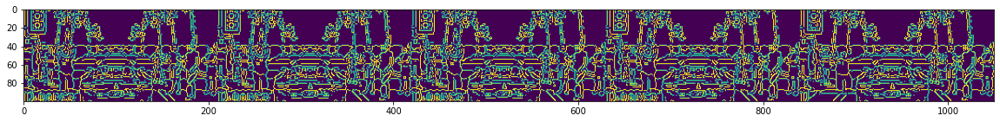

AccBrake 0.06285714285714286 ScorePosition 0.9948531 Velocity 0.0 Score 0.7190894030358067


None

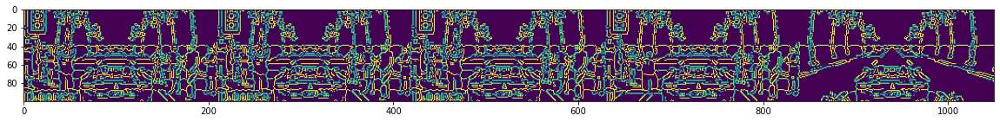

AccBrake 0.08 ScorePosition 1.0561218 Velocity 0.011764705882352941 Score 0.7929430623463659


None

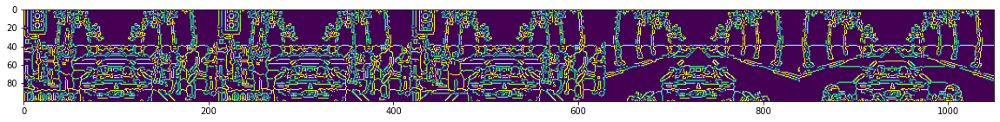

AccBrake 0.10285714285714286 ScorePosition 0.99202317 Velocity 0.029411764705882353 Score 0.7579804893567691


None

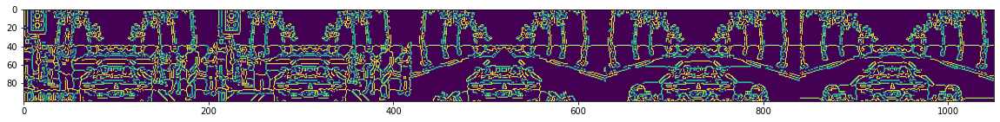

AccBrake 0.12571428571428572 ScorePosition 0.87850857 Velocity 0.052941176470588235 Score 0.666514305015975


None

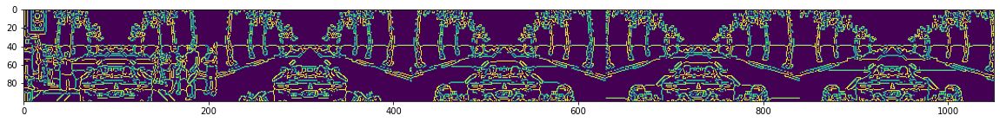

AccBrake 0.16 ScorePosition 0.902096 Velocity 0.07647058823529412 Score 0.7074927043940872


None

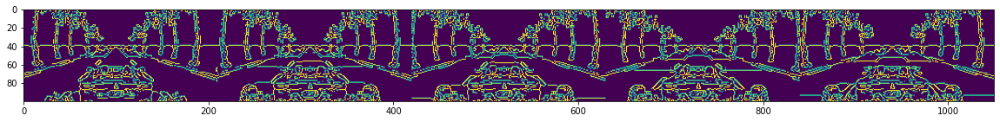

AccBrake 0.18285714285714286 ScorePosition 0.8765417 Velocity 0.1 Score 0.6934703150885173


None

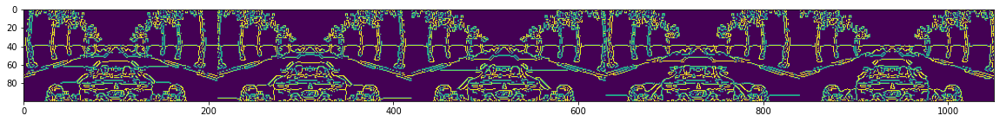

AccBrake 0.2057142857142857 ScorePosition 0.99098545 Velocity 0.12941176470588237 Score 0.8093773317300585


None

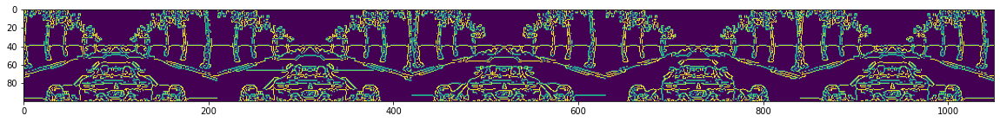

AccBrake 0.21714285714285714 ScorePosition 1.0099325 Velocity 0.17647058823529413 Score 0.8182013431020438


None

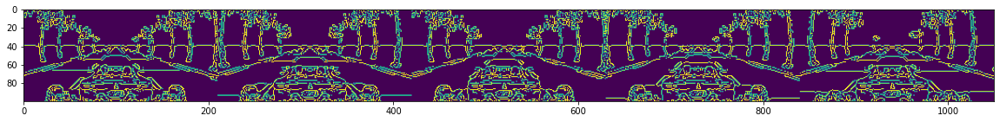

AccBrake 0.23714285714285716 ScorePosition 1.0365528 Velocity 0.21764705882352942 Score 0.8424345407443581


None

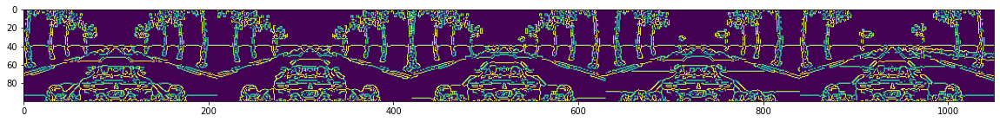

AccBrake 0.24857142857142858 ScorePosition 0.8815291 Velocity 0.2411764705882353 Score 0.7530159026531789


None

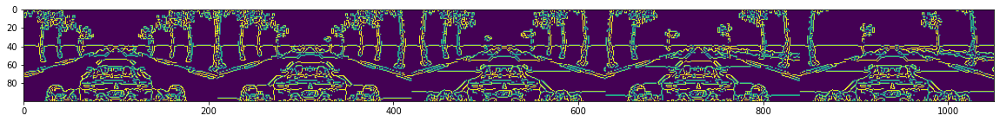

AccBrake 0.26285714285714284 ScorePosition 0.9711172 Velocity 0.2647058823529412 Score 0.8402112002255194


None

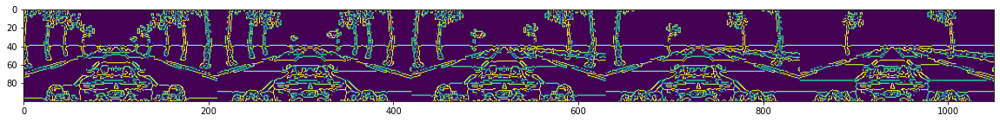

AccBrake 0.2857142857142857 ScorePosition 0.9389718 Velocity 0.28823529411764703 Score 0.8247476386718133


None

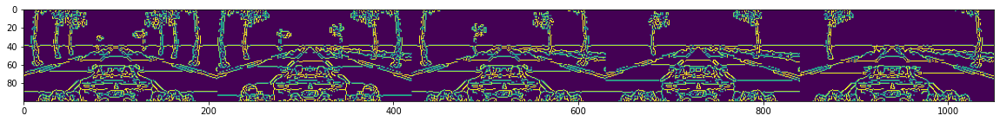

AccBrake 0.29428571428571426 ScorePosition 1.0026567 Velocity 0.3058823529411765 Score 0.8826289457543882


None

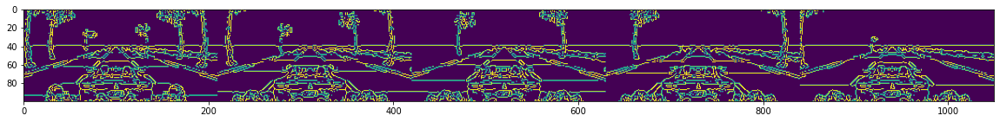

AccBrake 0.29428571428571426 ScorePosition 0.94356734 Velocity 0.32941176470588235 Score 0.8325035817232888


None

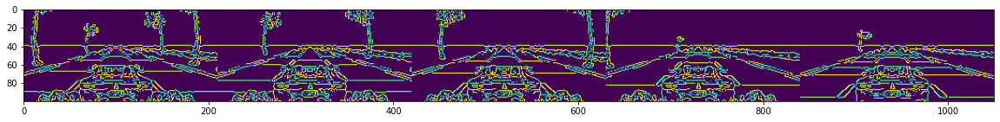

AccBrake 0.29714285714285715 ScorePosition 0.8691572 Velocity 0.35294117647058826 Score 0.7669106640962572


None

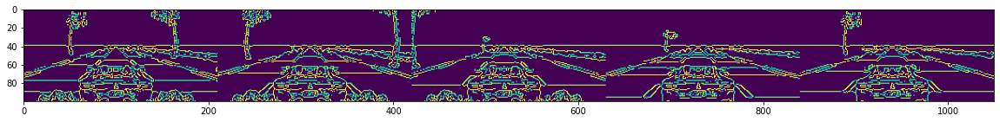

AccBrake 0.27714285714285714 ScorePosition 0.9681819 Velocity 0.3764705882352941 Score 0.8413038002821083


None

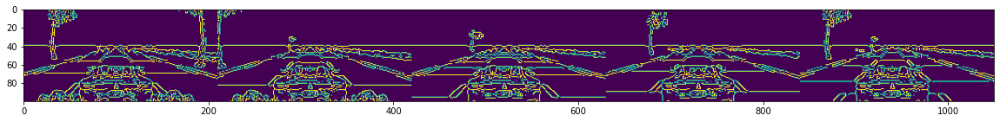

AccBrake 0.26857142857142857 ScorePosition 0.97497493 Velocity 0.40588235294117647 Score 0.8409296070993257


None

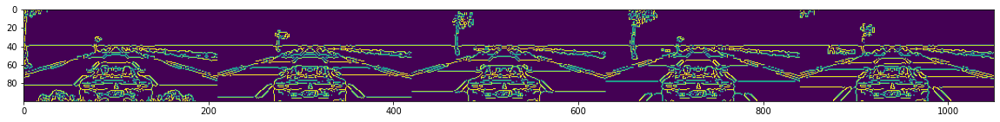

AccBrake 0.2857142857142857 ScorePosition 0.8233495 Velocity 0.4235294117647059 Score 0.7121139637223166


None

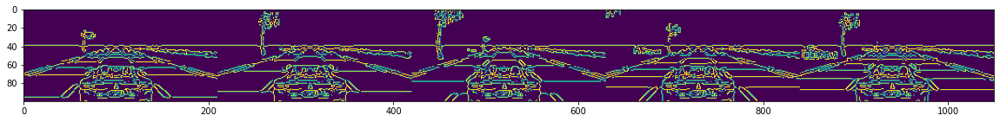

AccBrake 0.29714285714285715 ScorePosition 0.9104087 Velocity 0.4470588235294118 Score 0.7992365831565116


None

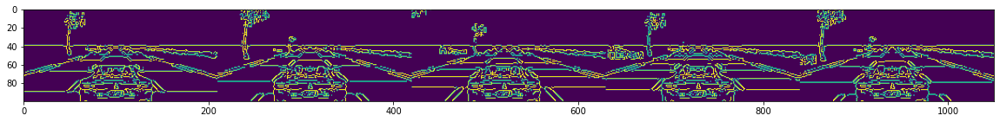

AccBrake 0.32857142857142857 ScorePosition 0.93421507 Velocity 0.47058823529411764 Score 0.8367133005142976


None

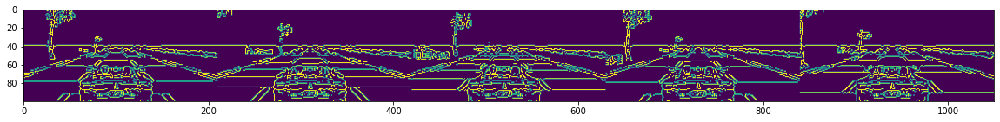

AccBrake 0.3657142857142857 ScorePosition 0.96184725 Velocity 0.4823529411764706 Score 0.5981882370585475


None

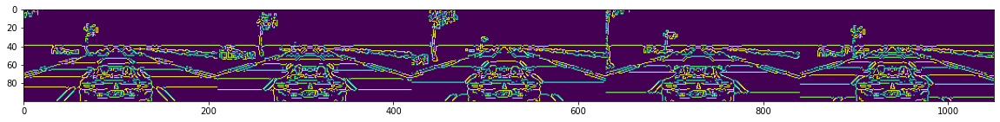

AccBrake 0.4085714285714286 ScorePosition 0.9979444 Velocity 0.5058823529411764 Score 0.9274243898709598


None

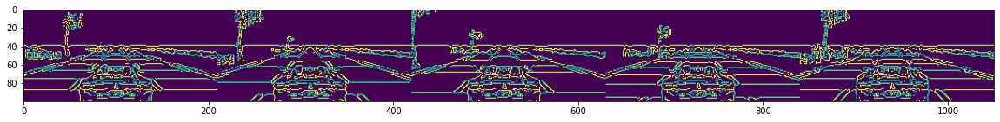

AccBrake 0.44285714285714284 ScorePosition 0.9827339 Velocity 0.5294117647058824 Score 0.6554307817602105


None

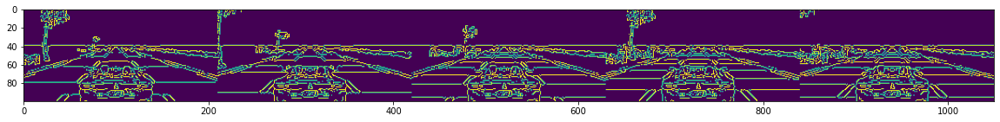

AccBrake 0.47714285714285715 ScorePosition 0.96602076 Velocity 0.5529411764705883 Score 0.9176106723862507


None

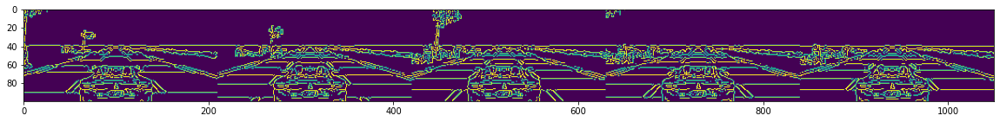

AccBrake 0.5 ScorePosition 0.89740604 Velocity 0.5823529411764706 Score 0.8683800793130015


None

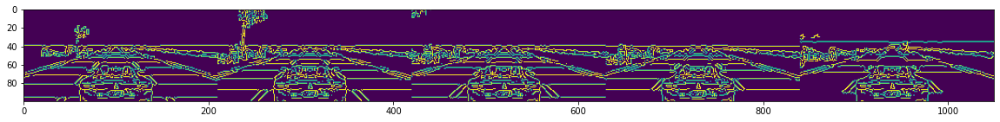

AccBrake 0.5371428571428571 ScorePosition 0.9327458 Velocity 0.011764705882352941 Score 1.1265475818113406


None

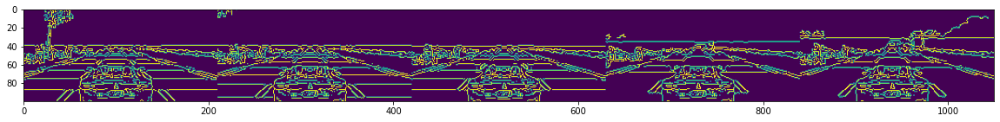

AccBrake 0.5485714285714286 ScorePosition 1.1114316 Velocity 0.6294117647058823 Score 1.0507062055893062


None

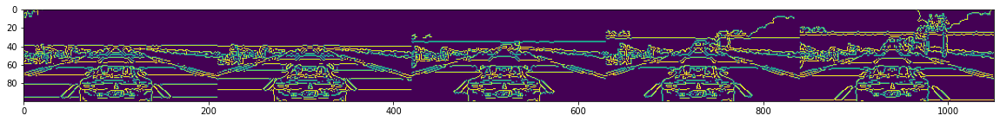

AccBrake 0.5657142857142857 ScorePosition 1.086239 Velocity 0.047058823529411764 Score 1.2349458234603707


None

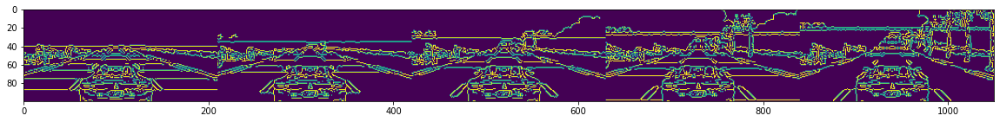

AccBrake 0.5885714285714285 ScorePosition 0.87996393 Velocity 0.6470588235294118 Score 0.9074158915702747


None

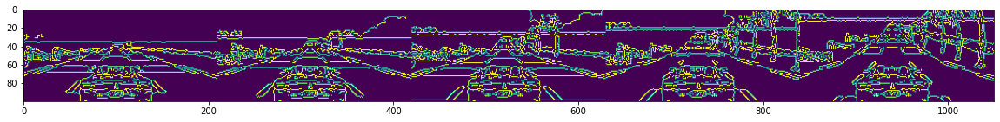

AccBrake 0.6 ScorePosition 0.9825713 Velocity 0.6705882352941176 Score 0.9934135100545731


None

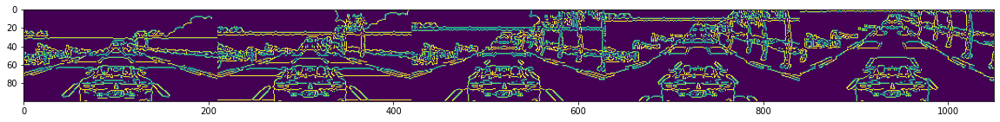

AccBrake 0.6228571428571429 ScorePosition 0.71933925 Velocity 0.6941176470588235 Score 0.7896893813336988


None

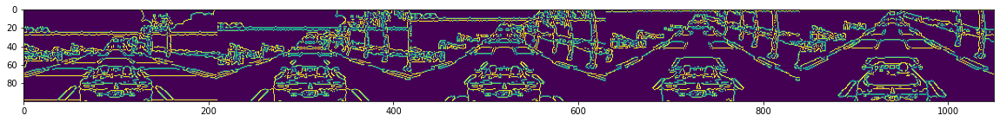

AccBrake 0.6114285714285714 ScorePosition 0.78657734 Velocity 0.7176470588235294 Score 0.841514329521486


None

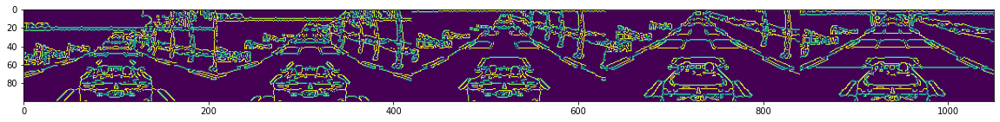

AccBrake 0.6685714285714286 ScorePosition 0.9208707 Velocity 0.7470588235294118 Score 0.9773375496474314


None

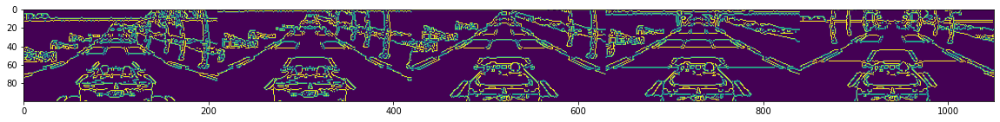

AccBrake 0.6914285714285714 ScorePosition 0.88356763 Velocity 0.7764705882352941 Score 0.9554115571565496


None

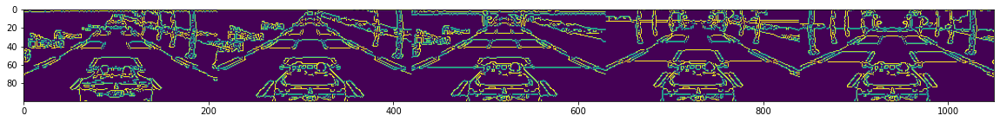

AccBrake 0.6771428571428572 ScorePosition 0.8421658 Velocity 0.8058823529411765 Score 0.9102742387867343


None

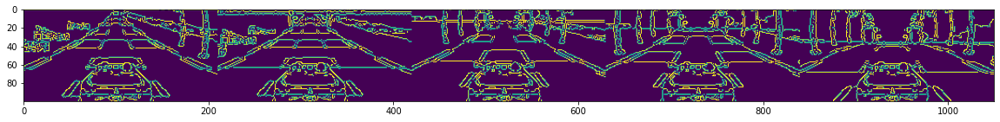

AccBrake 0.6885714285714286 ScorePosition 0.8200498 Velocity 0.8352941176470589 Score 0.8945840909727605


None

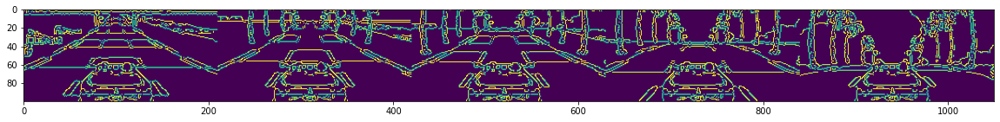

AccBrake 0.7457142857142857 ScorePosition 0.9898123 Velocity 0.8529411764705882 Score 1.0448548989804718


None

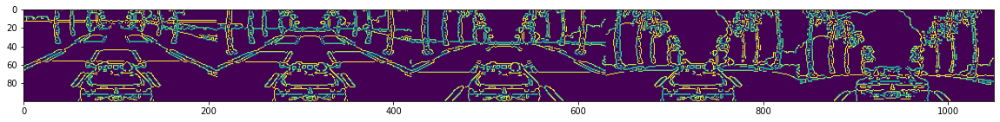

AccBrake 0.7285714285714285 ScorePosition 0.8343309 Velocity 0.8941176470588236 Score 0.9080916924477244


None

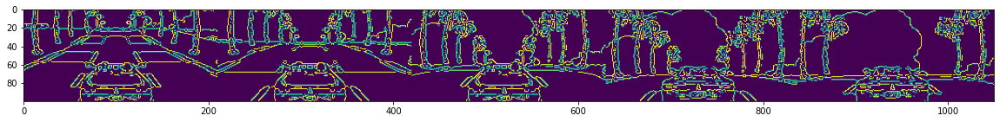

AccBrake 0.74 ScorePosition 0.79208696 Velocity 0.9176470588235294 Score 0.8708245531906227


None

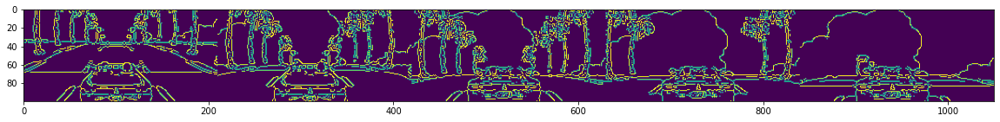

AccBrake 0.7885714285714286 ScorePosition 1.1412792 Velocity 0.9294117647058824 Score 1.1428957261441208


None

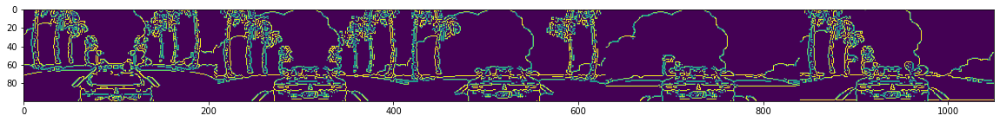

AccBrake 0.8 ScorePosition 0.95990676 Velocity 0.9529411764705882 Score 1.015589305394909


None

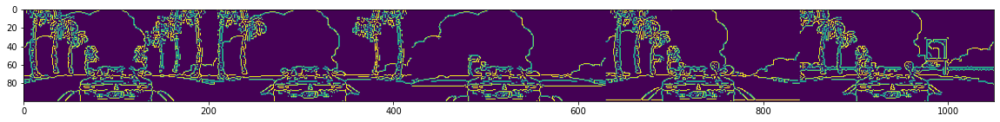

AccBrake 0.8 ScorePosition 0.9936641 Velocity 0.9705882352941176 Score 1.035580165298473


None

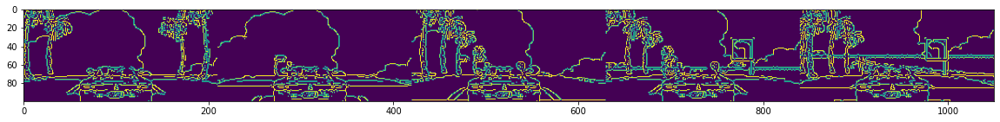

AccBrake 0.68 ScorePosition 1.1255589 Velocity 0.9764705882352941 Score 1.0813863589751496


None

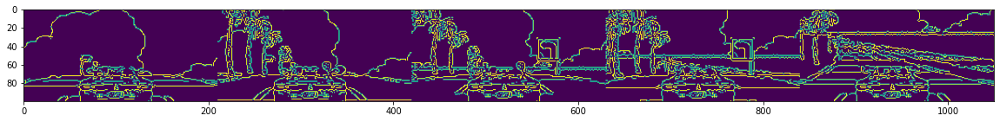

AccBrake 0.52 ScorePosition 0.8398192 Velocity 0.9823529411764705 Score 0.777538407706648


None

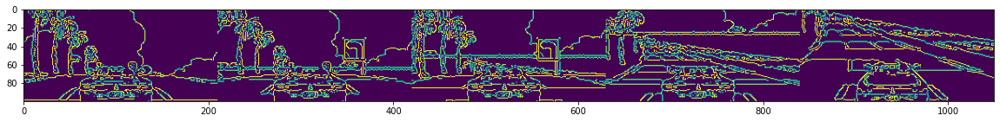

AccBrake 0.48 ScorePosition 0.93400496 Velocity 0.9941176470588236 Score 0.8409627617503249


None

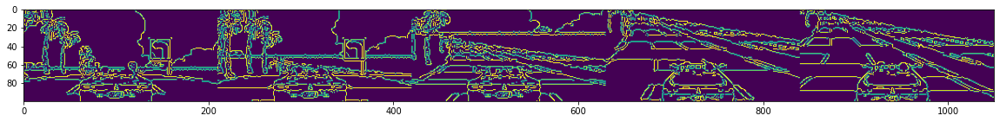

AccBrake 0.52 ScorePosition 0.85941094 Velocity 0.9941176470588236 Score 0.7980362560774614


None

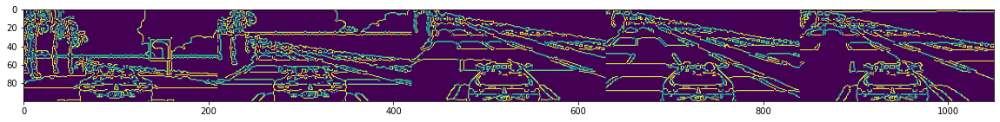

AccBrake 0.48 ScorePosition 0.5645306 Velocity 1.0 Score 0.4646230317915484


None

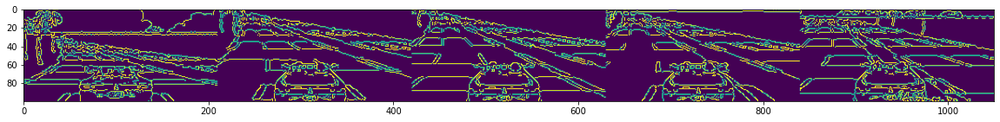

AccBrake 0.6 ScorePosition 0.34922534 Velocity 0.9941176470588236 Score 0.25663119378345794


None

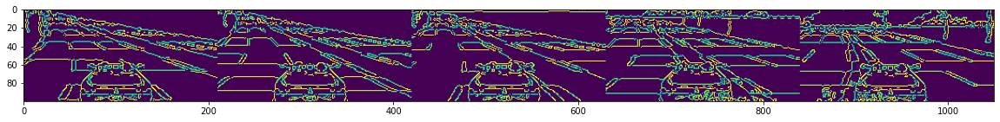

AccBrake 0.64 ScorePosition 0.5334669 Velocity 0.9588235294117647 Score 0.5551646785744058


None

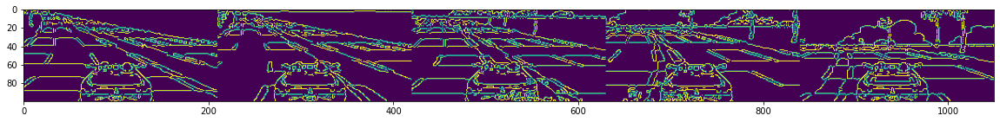

AccBrake 0.68 ScorePosition 0.79648954 Velocity 0.9647058823529412 Score 0.8339480779171794


None

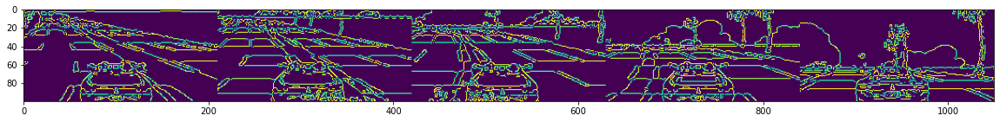

AccBrake 0.5171428571428571 ScorePosition 0.67777705 Velocity 0.9764705882352941 Score 0.6115494123958374


None

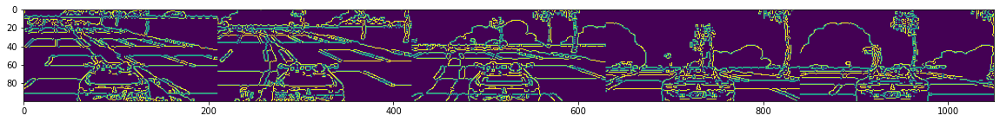

AccBrake 0.5342857142857143 ScorePosition 0.80136245 Velocity 0.9823529411764705 Score 0.6702150798406993


None

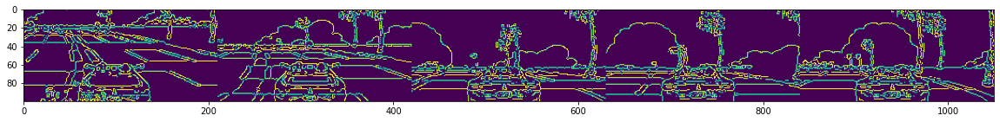

AccBrake 0.5142857142857142 ScorePosition 0.6098122 Velocity 0.9882352941176471 Score 0.3099242797355012


None

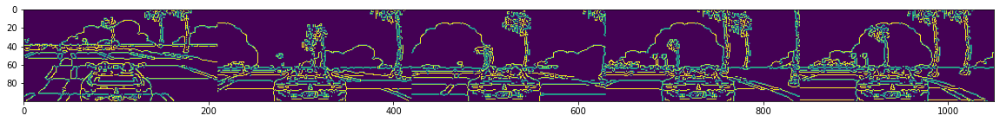

AccBrake 0.54 ScorePosition 0.8389333 Velocity 0.9941176470588236 Score 0.547908255149306


None

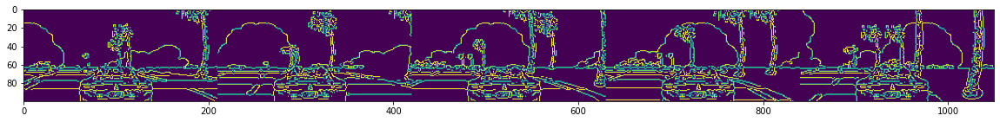

AccBrake 0.44857142857142857 ScorePosition -0.043086823 Velocity 0.9941176470588236 Score -9.210340371976182


None

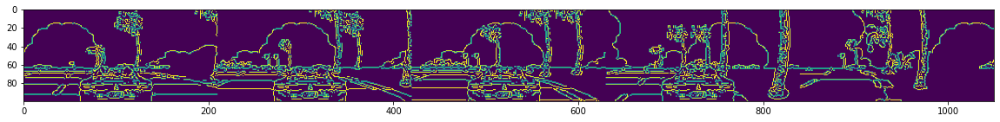

AccBrake 0.45714285714285713 ScorePosition -0.043086823 Velocity 0.9470588235294117 Score -9.210340371976182


None

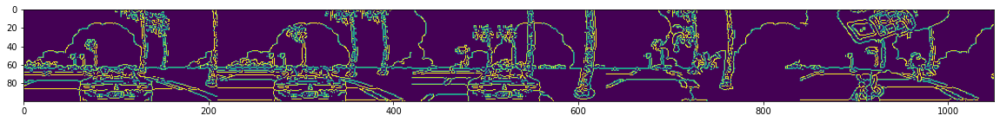

AccBrake 0.34285714285714286 ScorePosition 0.3417071 Velocity 0.8 Score -1.234510207238891


None

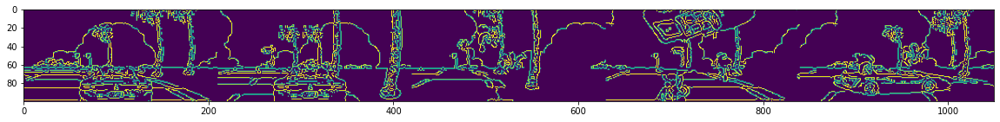

AccBrake 0.2057142857142857 ScorePosition -0.033094298 Velocity 0.6176470588235294 Score -9.210340371976182


None

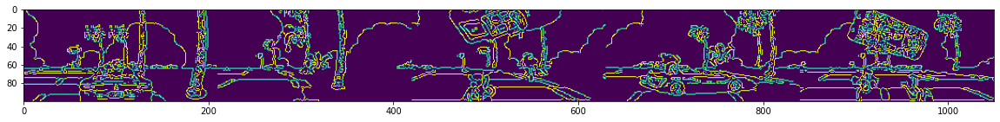

AccBrake 0.14 ScorePosition 0.06698705 Velocity 0.5058823529411764 Score -9.210340371976182


None

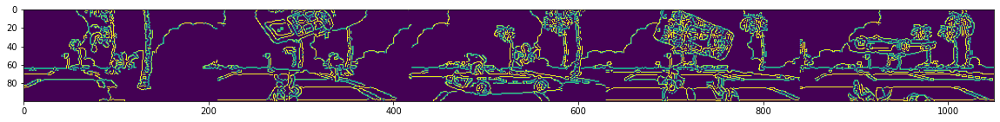

AccBrake 0.07142857142857142 ScorePosition -0.043086823 Velocity 0.3588235294117647 Score -9.210340371976182


None

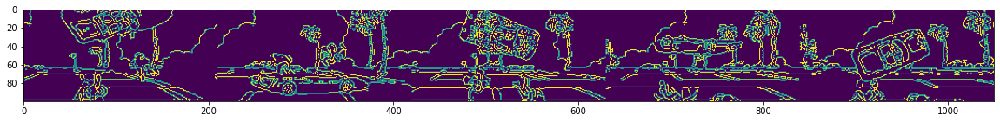

AccBrake 0.025714285714285714 ScorePosition 0.09986009 Velocity 0.21176470588235294 Score -9.210340371976182


None

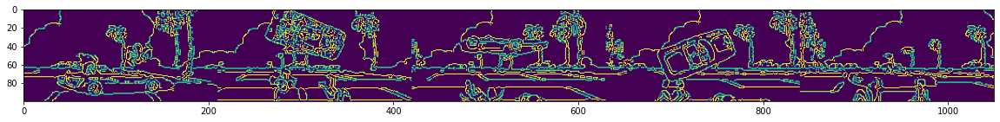

AccBrake 0.002857142857142857 ScorePosition -0.043086823 Velocity 0.06470588235294118 Score -9.210340371976182


None

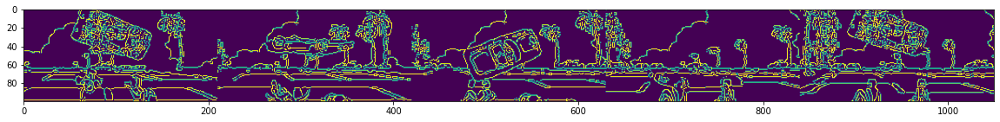

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

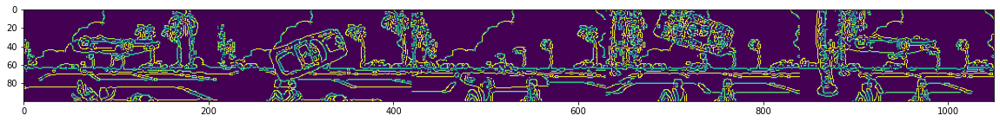

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

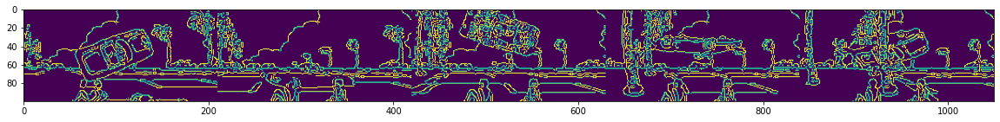

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

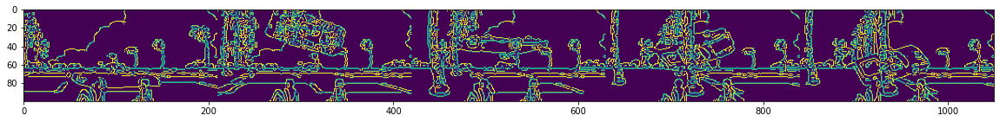

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

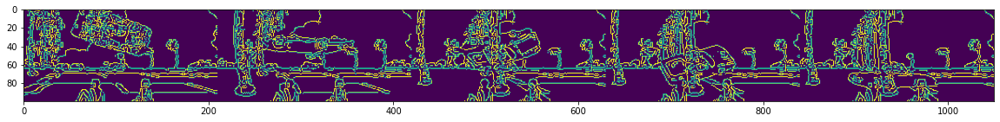

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

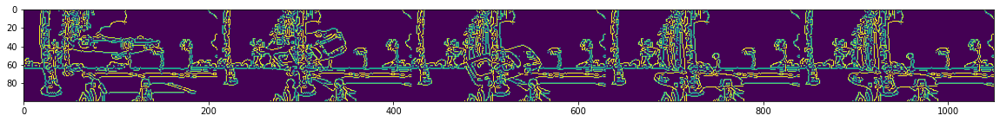

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

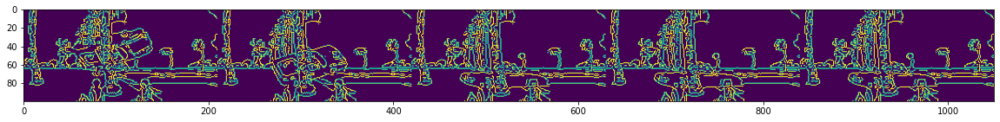

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

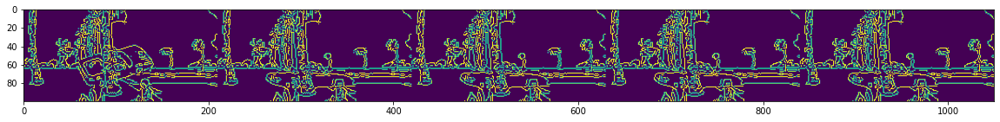

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

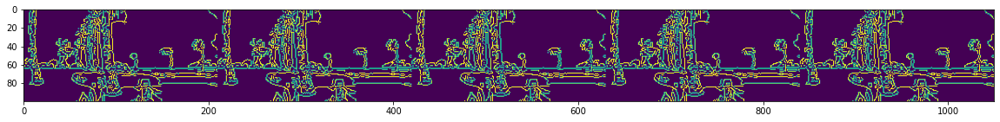

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

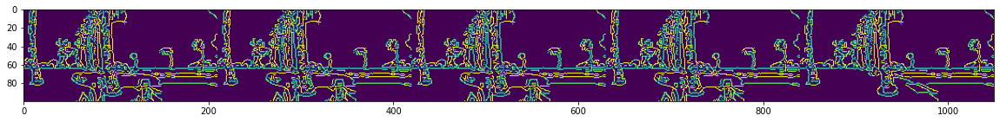

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

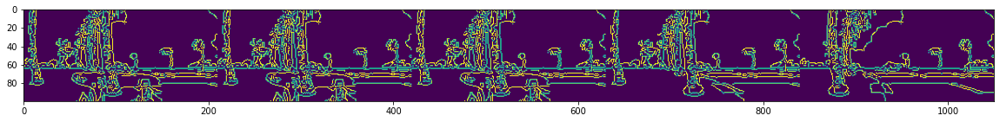

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

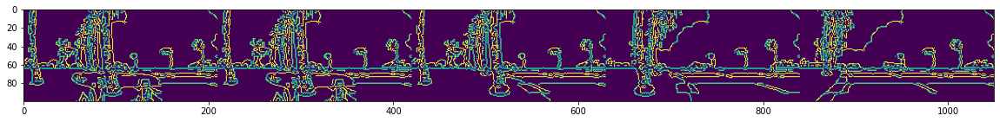

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

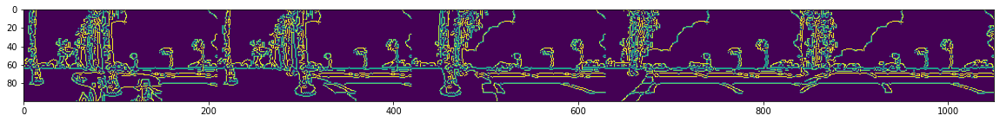

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

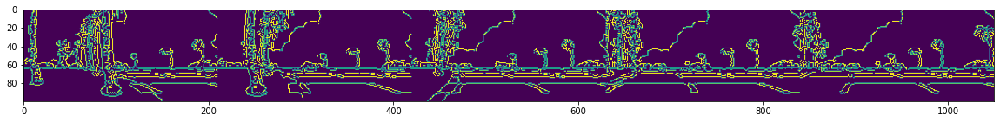

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

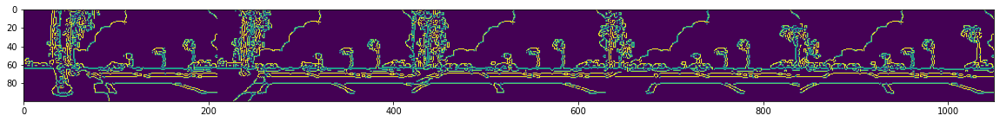

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

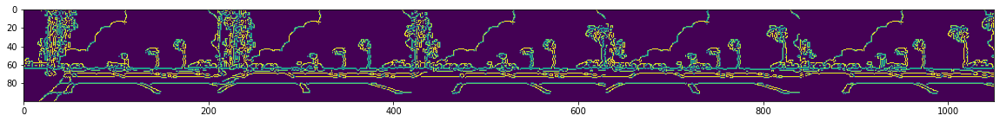

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

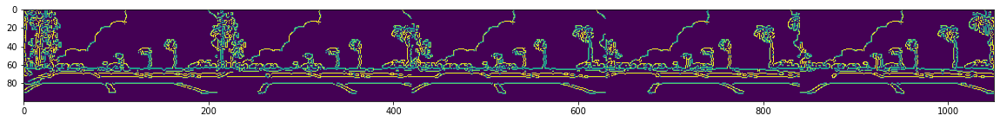

AccBrake 0 ScorePosition 0 Velocity 0.0 Score -9.210340371976182


None

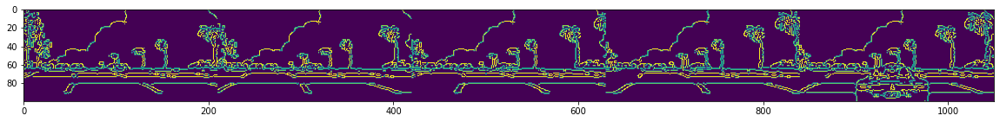

AccBrake 0.005714285714285714 ScorePosition 0.8725085 Velocity 0.0 Score 0.5667310107618609


None

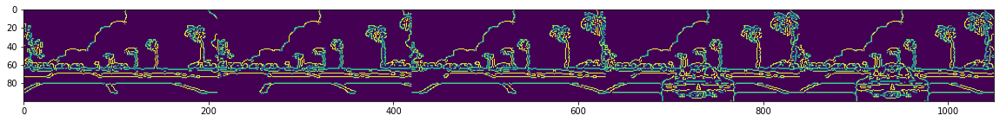

AccBrake 0.014285714285714285 ScorePosition 0.8725085 Velocity 0.0 Score 0.5814972225868922


None

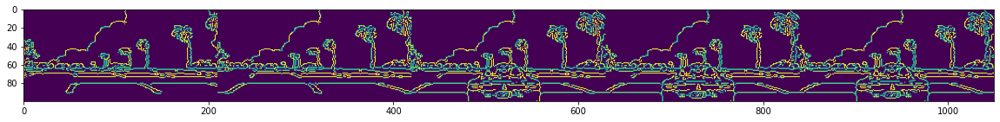

AccBrake 0.025714285714285714 ScorePosition 0.8725085 Velocity 0.0 Score 0.6008523327043547


None

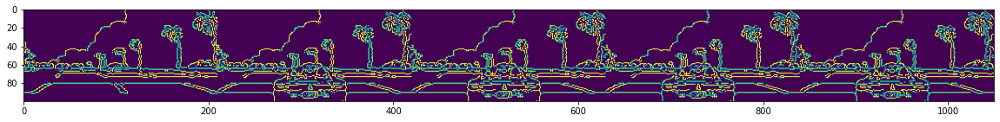

AccBrake 0.04 ScorePosition 0.8725085 Velocity 0.0 Score 0.6213759744654919


None

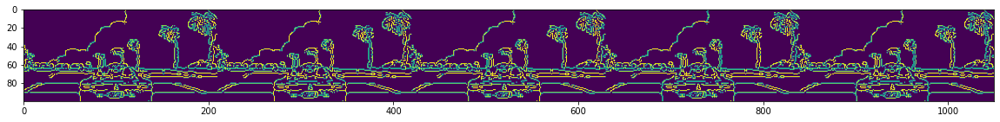

AccBrake 0.06285714285714286 ScorePosition 0.90936613 Velocity 0.0 Score 0.6838992522443506


None

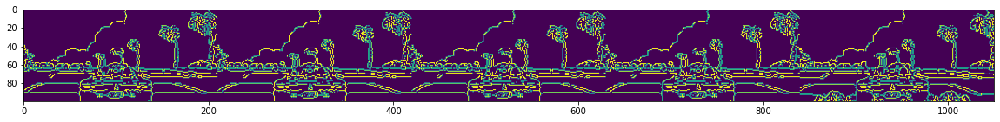

AccBrake 0.08 ScorePosition 0.8364495 Velocity 0.011764705882352941 Score 0.6199210906006272


None

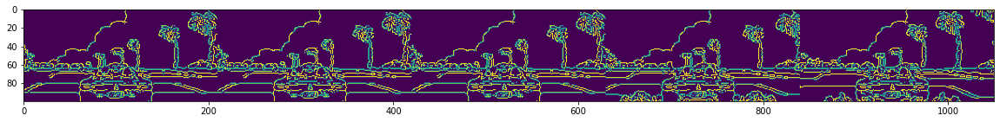

AccBrake 0.09714285714285714 ScorePosition 0.7886241 Velocity 0.029411764705882353 Score 0.5833535931442835


None

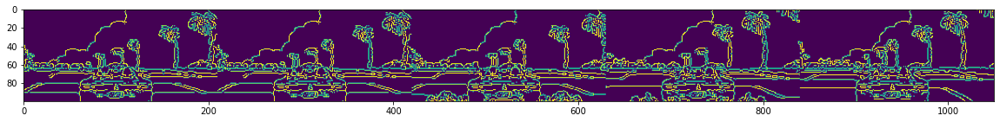

AccBrake 0.12 ScorePosition 0.76825994 Velocity 0.052941176470588235 Score 0.5832285160354072


None

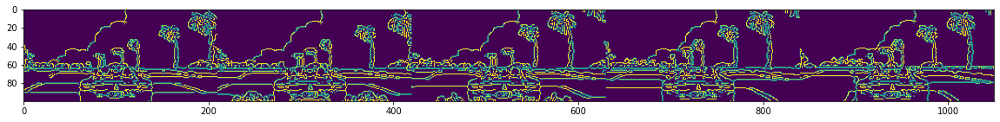

AccBrake 0.1457142857142857 ScorePosition 0.7338844 Velocity 0.07647058823529412 Score 0.5722818640008979


None

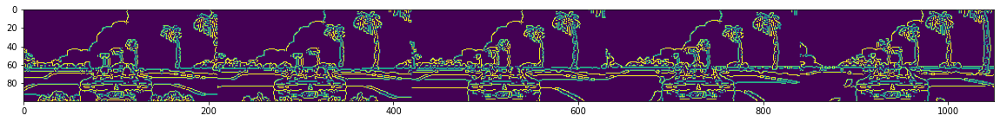

AccBrake 0.16857142857142857 ScorePosition 0.79263246 Velocity 0.1 Score 0.6484948801769667


None

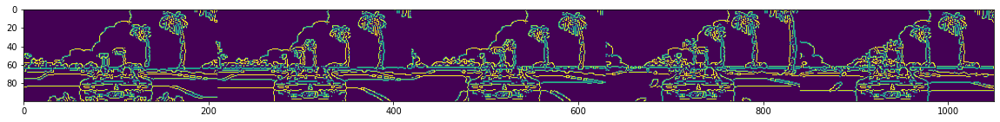

AccBrake 0.19142857142857142 ScorePosition 0.8695512 Velocity 0.11764705882352941 Score 0.7368551495716307


None

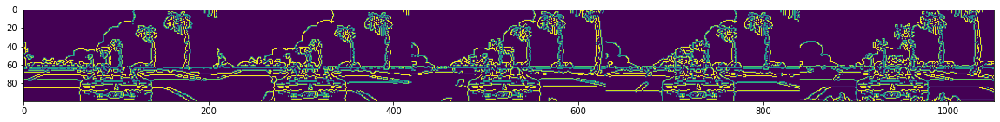

AccBrake 0.21428571428571427 ScorePosition 0.59500456 Velocity 0.14705882352941177 Score 0.4429124599666346


None

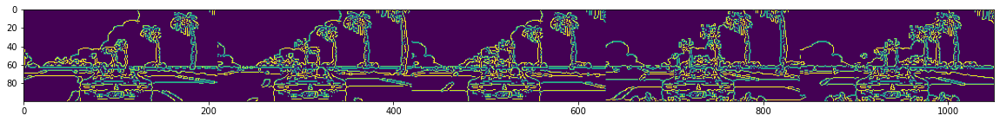

AccBrake 0.23714285714285716 ScorePosition 0.70355654 Velocity 0.18823529411764706 Score 0.5763605514766382


None

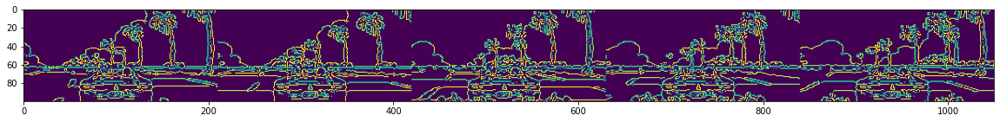

AccBrake 0.24 ScorePosition 0.7407125 Velocity 0.23529411764705882 Score 0.5996191875233623


None

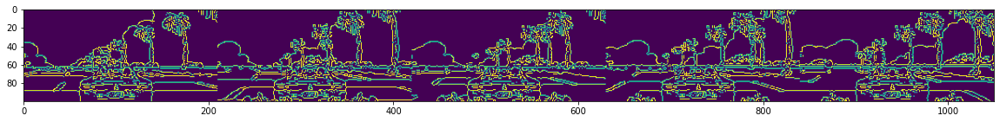

AccBrake 0.26857142857142857 ScorePosition 0.8886835 Velocity 0.25882352941176473 Score 0.766314356918799


None

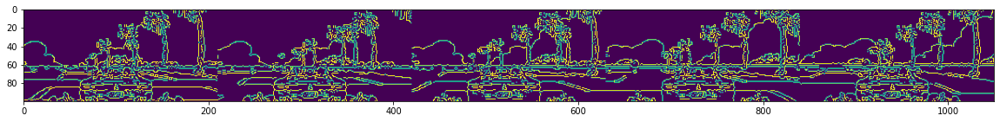

AccBrake 0.2914285714285714 ScorePosition 0.9217374 Velocity 0.27647058823529413 Score 0.8120630747353037


None

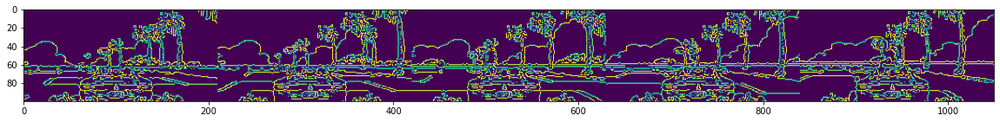

AccBrake 0.29428571428571426 ScorePosition 0.9118185 Velocity 0.3 Score 0.8044961314926717


None

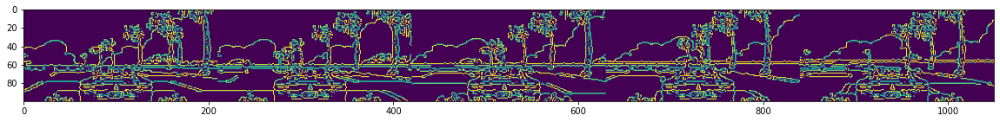

AccBrake 0.31142857142857144 ScorePosition 0.75977975 Velocity 0.3235294117647059 Score 0.6701433526395568


None

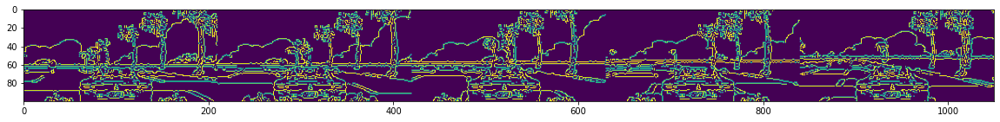

AccBrake 0.3485714285714286 ScorePosition 0.9132322 Velocity 0.3352941176470588 Score 0.8399332281153855


None

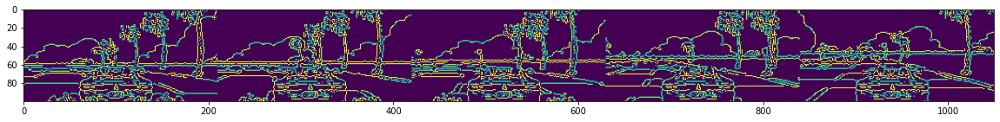

AccBrake 0.35428571428571426 ScorePosition 0.6757053 Velocity 0.36470588235294116 Score 0.613493837037174


None

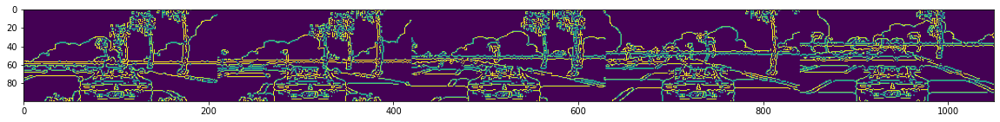

AccBrake 0.37714285714285717 ScorePosition 0.9045562 Velocity 0.3941176470588235 Score 0.8447654095888342


None

In [78]:
for i in range(100):
    plt.figure(figsize=(20,20))
    #img = model_capture_return_images( [ process_img(j[0][120:,60:270]) for j in queue[i-4:i+1]])
    plt.imshow(np.hstack(np.array([frame_imgs[i,:,:,0],frame_imgs[i,:,:,1],frame_imgs[i,:,:,2],frame_imgs[i,:,:,3],frame_imgs[i,:,:,4]])))
    #plt.imshow(np.hstack(np.array([img[:,:,0],img[:,:,1],img[:,:,2],img[:,:,3],img[:,:,4]])))
    plt.show()
    display(print('AccBrake', score_accbrake[i],'ScorePosition', score_position[i], 'Velocity', velocity[i], 'Score', score[i]))